In [213]:
import numpy as np
import numpy.ma as ma
import matplotlib
import matplotlib.pyplot as plt
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)

import os
from astropy import units as u
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
import warnings
warnings.filterwarnings('ignore')

font = {'size'   : 12}
matplotlib.rc('font', **font)

In [214]:
#for easy access to files
M42 = os.listdir('M42/')[1:]
NGC2174 = os.listdir('NGC2174/')[1:]
print(NGC2174)

['Mean_NGC2174_Halpha_SN.FIT', 'Mean_NGC2174_Hbeta_SN.FIT', 'Mean_NGC2174_OIII_SN.FIT', 'Mean_NGC2174_SII_SN.FIT']


In [3]:
#importing images that were saved as FIT files
M42_file_path = []
NGC2174_file_path = []

for i in M42:
    M42_path = get_pkg_data_filename('M42/' + i)
    M42_file_path.append(M42_path)

for i in NGC2174:
    NGC2174_path = get_pkg_data_filename('NGC2174/' + i)
    NGC2174_file_path.append(NGC2174_path)

print(M42_file_path)

['M42\\M42_MEAN_Ha_300_REALIGN_SN.FIT', 'M42\\M42_MEAN_Ha_30_REALIGN_SN.FIT', 'M42\\M42_MEAN_Hb300_REALIGN_SN.FIT', 'M42\\M42_MEAN_Hb30_REALIGN_SN.FIT', 'M42\\M42_MEAN_OIII_300_REALIGN_SN.FIT', 'M42\\M42_MEAN_OIII_30_REALIGN_SN.FIT', 'M42\\M42_MEAN_SII_300_REALIGN_SN.FIT', 'M42\\M42_MEAN_SII_30_REALIGN_SN.FIT']


In [4]:
#gives header information
fits.info(M42_file_path[0])

Filename: M42\M42_MEAN_Ha_300_REALIGN_SN.FIT
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      67   (2048, 2048)   float32   


In [5]:
#gets data/array for the image --- ext seems like the index

#M42_imgs = []

#for i in file_path:
#    im = fits.getdata(i, ext=0)
#    M42_imgs.append(im)

In [6]:
M42filepath = np.array(M42_file_path)
M42filepath = M42filepath.reshape(4,2)

NGC2174filepath = np.array(NGC2174_file_path)
NGC2174filepath = NGC2174filepath.reshape(2,2)

In [7]:
NGC2174filepath

array([['NGC2174\\Mean_NGC2174_Halpha_SN.FIT',
        'NGC2174\\Mean_NGC2174_Hbeta_SN.FIT'],
       ['NGC2174\\Mean_NGC2174_OIII_SN.FIT',
        'NGC2174\\Mean_NGC2174_SII_SN.FIT']], dtype='<U34')

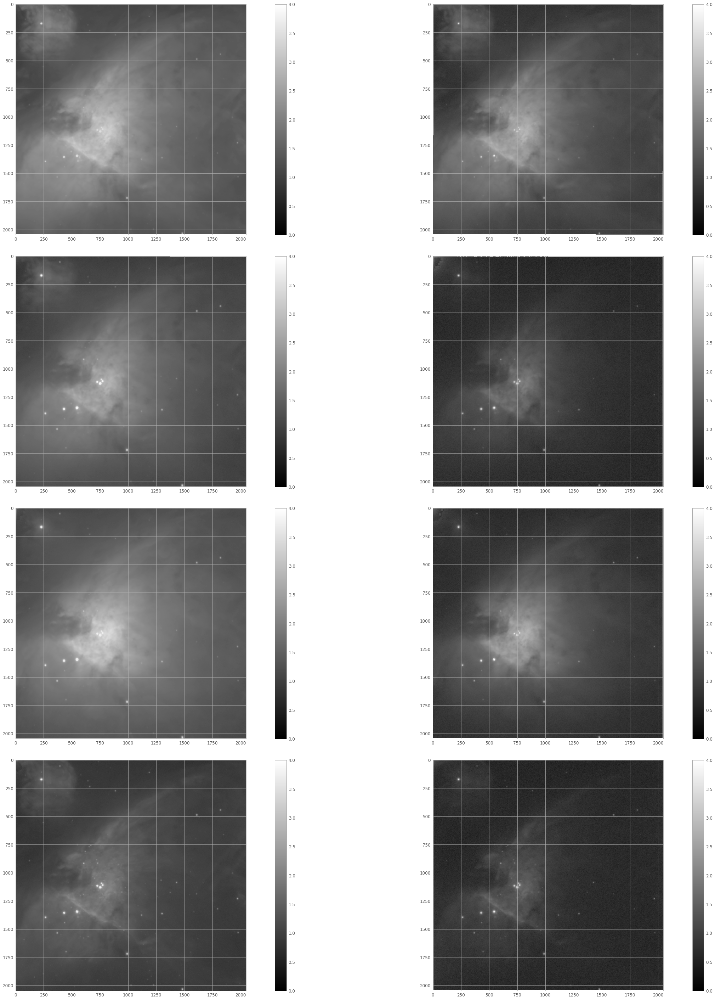

In [8]:
fig, axs = plt.subplots(4,2, figsize=(40,40))
for i in range(len(M42filepath)):
    for j in range(2):
        im = fits.getdata(M42filepath[i][j], ext=0)
        img = axs[i][j].imshow(np.log10(im), cmap='gray', vmin=0, vmax=4)
        plt.colorbar(img, ax=axs[i,j])

plt.tight_layout(pad=3)
#plt.savefig("test.jpg")

In [9]:
#image before mask
#for img in M42_imgs:
#    plt.figure()
#    plt.imshow(np.log10(img), cmap='gray', vmin=0, vmax=3)
#    plt.colorbar()

In [10]:
#mask that rids pixels with lower than 5 SN
#M42_masked = []

#for i in M42_imgs:
#    masked = np.ma.masked_less(i, 5)
#    M42_masked.append(masked)

### Masking M42 images

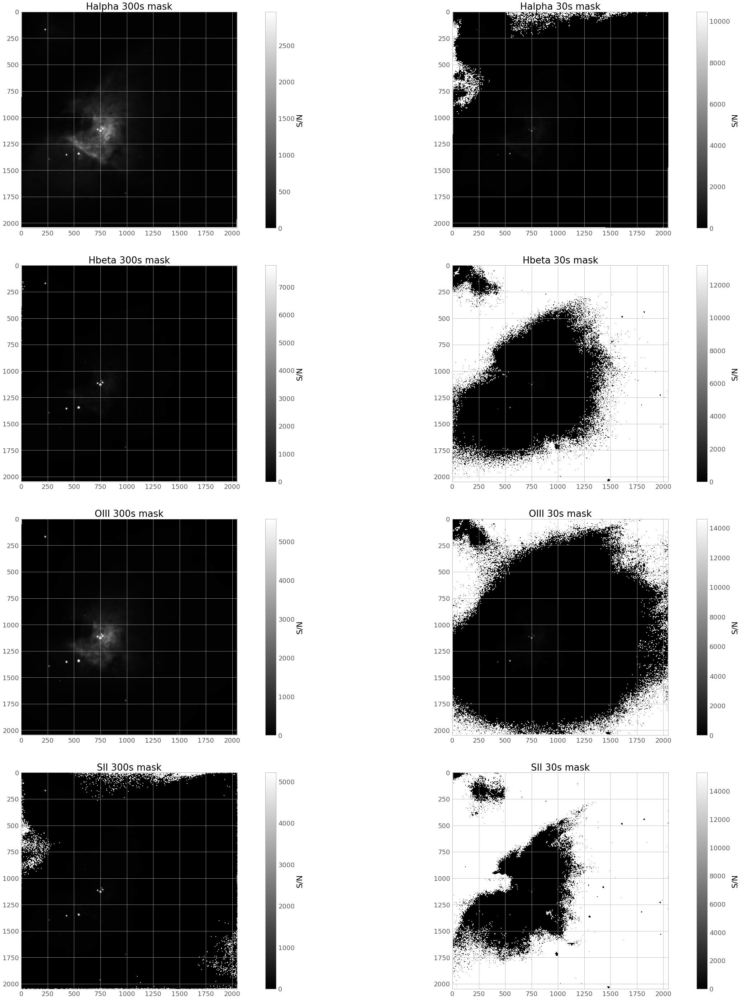

In [179]:
fig, axs = plt.subplots(4,2, figsize=(40,40))
for i in range(len(M42filepath)):
    for j in range(2):
        im = fits.getdata(M42filepath[i][j], ext=0)
        masked = np.ma.masked_less(im, 5)
        masked_img = axs[i][j].imshow(masked, cmap='gray', vmin=0)
        plt.colorbar(masked_img, ax=axs[i,j], label='S/N')

axs[0, 0].set_title("Halpha 300s mask")
axs[0, 1].set_title("Halpha 30s mask")
axs[1, 0].set_title("Hbeta 300s mask")
axs[1, 1].set_title("Hbeta 30s mask")
axs[2, 0].set_title("OIII 300s mask")
axs[2, 1].set_title("OIII 30s mask")
axs[3, 0].set_title("SII 300s mask")
axs[3, 1].set_title("SII 30s mask")

plt.tight_layout(pad=3)
plt.savefig("M42_mask")

In [12]:
#image after mask
#for img in M42_masked:
#    plt.figure()
#    plt.imshow(np.log10(img), cmap='gray', vmin=0, vmax=2)
#    plt.colorbar()

In [13]:
NGC2174filepath[0]

array(['NGC2174\\Mean_NGC2174_Halpha_SN.FIT',
       'NGC2174\\Mean_NGC2174_Hbeta_SN.FIT'], dtype='<U34')

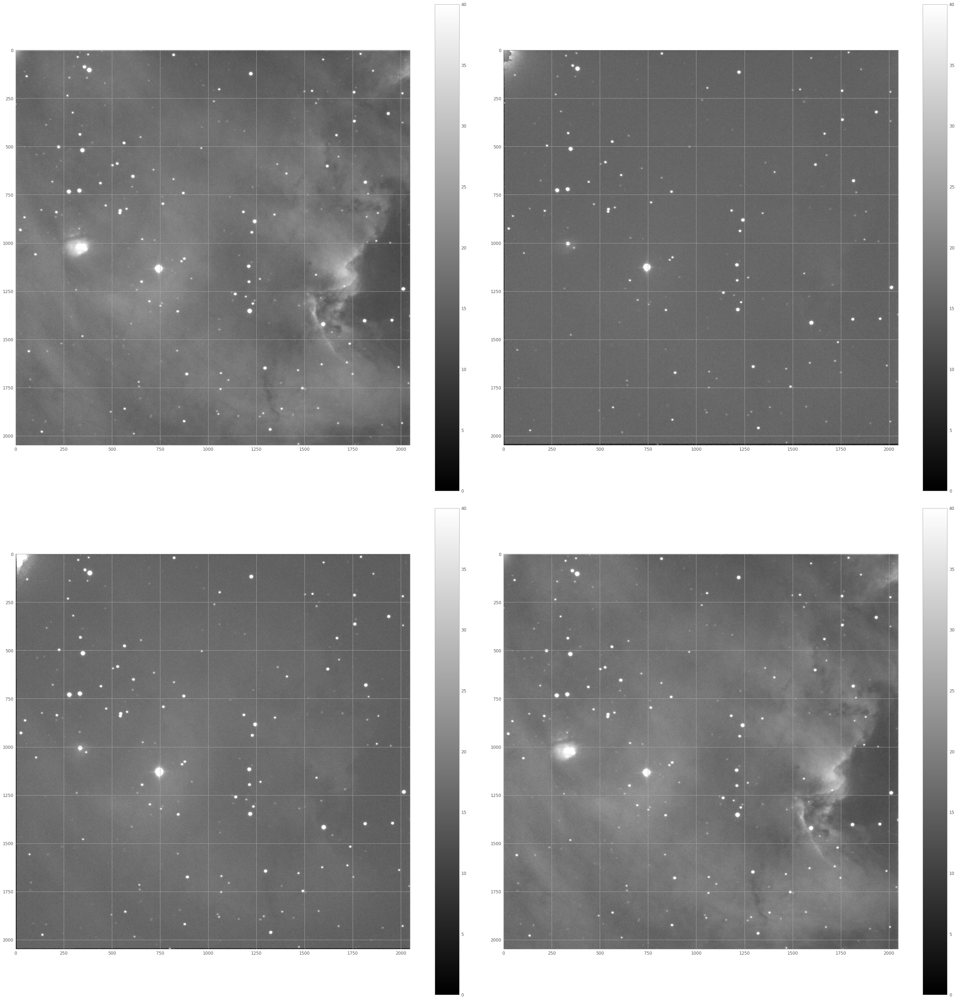

In [14]:
fig, axs = plt.subplots(2,2, figsize=(40,40))
for i in range(len(NGC2174filepath)):
    for j in range(2):
        im = fits.getdata(NGC2174filepath[i][j], ext=0)
        img = axs[i][j].imshow(im, cmap='gray', vmin=0, vmax=40)
        plt.colorbar(img, ax=axs[i,j])

plt.tight_layout(pad=3)

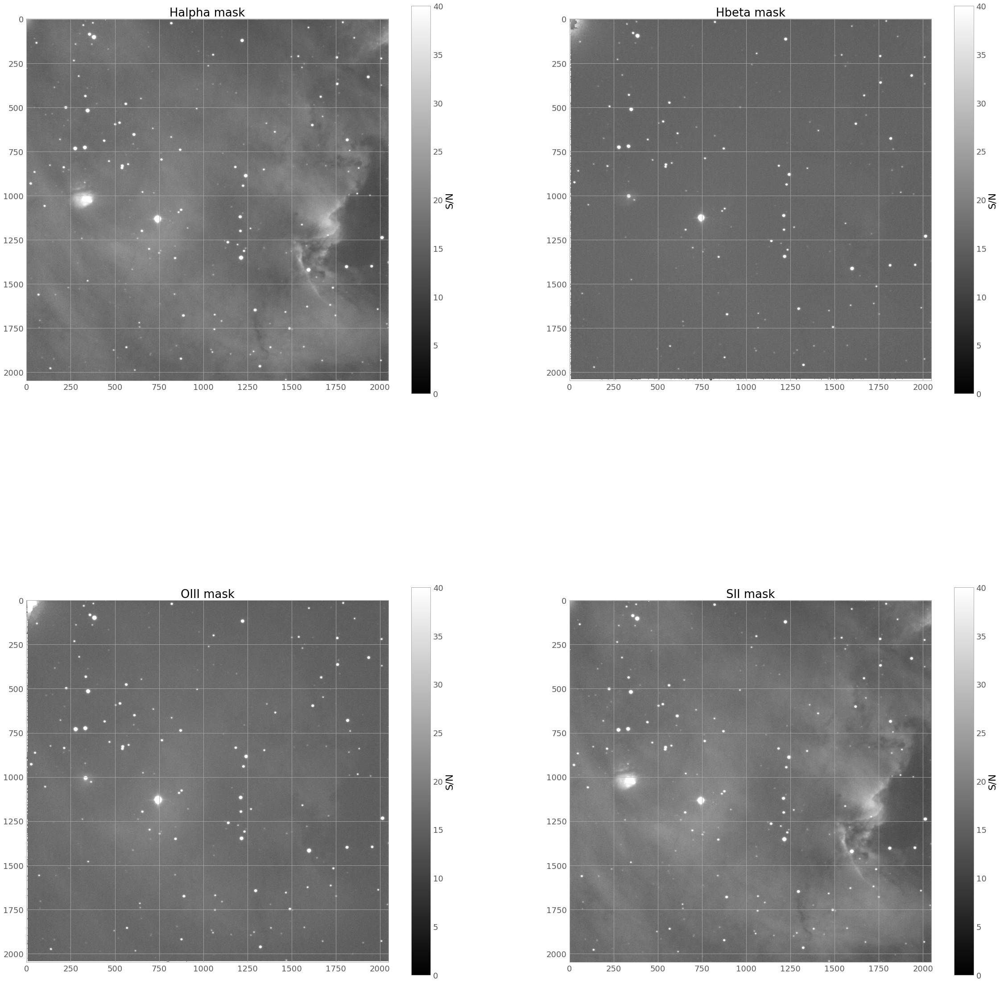

In [165]:
fig, axs = plt.subplots(2,2, figsize=(40,40))
for i in range(len(NGC2174filepath)):
    for j in range(2):
        im = fits.getdata(NGC2174filepath[i][j], ext=0)
        masked = np.ma.masked_less(im, 5)
        masked_img = axs[i][j].imshow(masked, cmap='gray', vmin=0, vmax=40)
        plt.colorbar(masked_img, ax=axs[i,j], label='S/N')

axs[0, 0].set_title("Halpha mask")
axs[0, 1].set_title("Hbeta mask")
axs[1, 0].set_title("OIII mask")
axs[1, 1].set_title("SII mask")

#plt.tight_layout(pad=3)
plt.savefig("NGC2174_mask")

In [16]:
Ha_3_4 = get_pkg_data_filename('Mean_NGC2174_Halpha_3_4.FIT')
Hb_3_4 = get_pkg_data_filename('Mean_NGC2174_Hbeta_3_4.FIT')
Ha_3_16 = get_pkg_data_filename('Mean_NGC2174_Halpha_3_16.FIT')
Hb_3_16 = get_pkg_data_filename('Mean_NGC2174_Hbeta_3_16.FIT')

NGC2173_Ha_3_4 = fits.getdata(Ha_3_4)
NGC2173_Hb_3_4 = fits.getdata(Hb_3_4)
NGC2173_Ha_3_16 = fits.getdata(Ha_3_16)
NGC2173_Hb_3_16 = fits.getdata(Hb_3_16)

NGC2173_Ha_final = fits.getdata('MEAN_NGC2174_Halpha_FINAL.FIT')
NGC2173_Hb_final = fits.getdata('MEAN_NGC2174_Hbeta_FINAL.FIT')
NGC2173_OIII_final = fits.getdata('MEAN_NGC2174_OIII_FINAL.FIT')
NGC2173_SII_final = fits.getdata('MEAN_NGC2174_SII_FINAL.FIT')

In [17]:
M42_Ha_final = fits.getdata('M42_final/M42_Halpha_300s.FIT')
M42_Hb_final = fits.getdata('M42_final/M42_Hbeta_300s.FIT')
M42_OIII_final = fits.getdata('M42_final/M42_OIII_300s.FIT')
M42_SII_final = fits.getdata('M42_final/M42_SII_300s.FIT')

In [18]:
numerM42 = 2.5*np.log10(2.86*(NGC2173_Hb_3_4 / NGC2173_Ha_3_4))

In [19]:
numer = 2.5*np.log10(2.86*(NGC2173_Hb_3_4 / NGC2173_Ha_3_4))

In [20]:
def a(l):
    x = 1 / l
    y = x - 1.82
    a_value = 1 + 0.104*y - 0.609*y**2 + 0.701*y**3 + 1.137*y**4 - 1.718*y**5 - 0.827*y**6 + 1.647*y**7 - 0.505*y**8
    return a_value

def b(l):
    x = 1 / l
    y = x - 1.82
    b_value = 1.952*y + 2.908*y**2 - 3.989*y**3 - 7.985*y**4 + 11.102*y**5 + 5.491*y**6 - 10.805*y**7 + 3.347*y**8
    return b_value

In [220]:
Halpha_lambda = 656.3 * u.nm
Halpha_lambda = Halpha_lambda.to(u.micron).value
Hbeta_lambda = 486.1 * u.nm
Hbeta_lambda = Hbeta_lambda.to(u.micron).value
OIII_lambda = 500.7 * u.nm
OIII_lambda = OIII_lambda.to(u.micron).value
SII_lambda = 670.0 * u.nm
SII_lambda = SII_lambda.to(u.micron).value

R_V = 5

In [22]:
denom = a(Halpha_lambda) + b(Halpha_lambda) / R_V - (a(Hbeta_lambda) + b(Hbeta_lambda) / R_V)

In [23]:
A_v = numer / denom

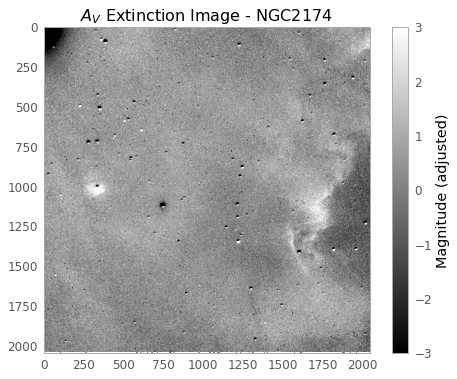

In [102]:
plt.imshow(A_v, cmap='gray', vmin=-3, vmax=3)
plt.rcParams["axes.grid"] = False
plt.colorbar(label='Magnitude (adjusted)')
plt.title(r'$A_V$ Extinction Image - NGC2174', size=16)
plt.savefig("A_V_NGC2174")

Text(0.5, 1.0, '$A_V$ Extinction Image')

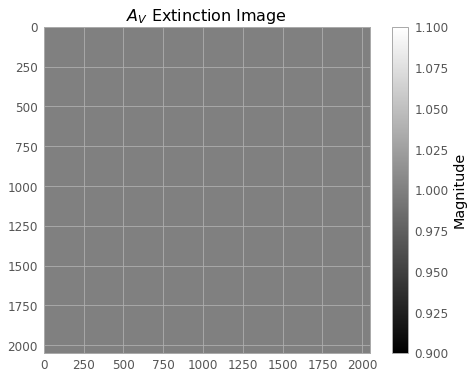

In [25]:
plt.imshow(NGC2173_Ha_final / NGC2173_Ha_final, cmap='gray')
plt.colorbar(label='Magnitude')
plt.title(r'$A_V$ Extinction Image', size=16)

In [26]:
Ha = fits.getdata('NGC2174/Mean_NGC2174_Halpha_SN.FIT')
Ha_masked = np.ma.masked_less(Ha, 5)

Hb = fits.getdata('NGC2174/Mean_NGC2174_Hbeta_SN.FIT')
Hb_masked = np.ma.masked_less(Hb, 5)

OIII = fits.getdata('NGC2174/Mean_NGC2174_OIII_SN.FIT')
OIII_masked = np.ma.masked_less(Hb, 5)

SII = fits.getdata('NGC2174/Mean_NGC2174_SII_SN.FIT')
SII_masked = np.ma.masked_less(Hb, 5)

In [28]:
Ha_masked.mask

array([[False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [29]:
mx = ma.masked_array(A_v, SII_masked.mask)

Text(0.5, 1.0, '$H_{\\alpha}$ mask')

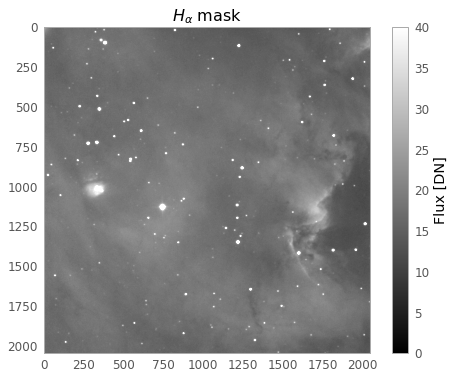

In [142]:
plt.imshow(Ha_masked, cmap='gray', vmin=0, vmax=40)
plt.colorbar(label='S/N')
plt.title(r'$H_{\alpha}$ mask', size=16)

Text(0.5, 1.0, '$H_{\\beta}$ mask')

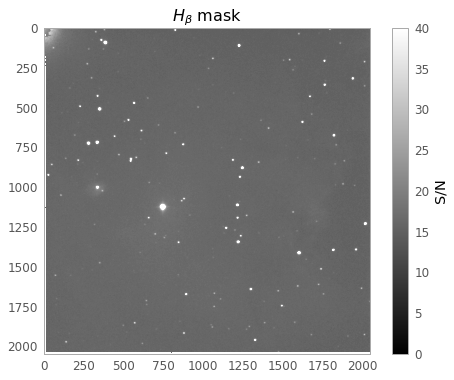

In [161]:
plt.imshow(Hb_masked, cmap='gray', vmin=0, vmax=40)
plt.colorbar(label='S/N')
plt.title(r'$H_{\beta}$ mask', size=16)

In [ ]:
plt.imshow(OIII_masked, cmap='gray', vmin=0, vmax=40)
plt.colorbar(label='S/N')
plt.title(r'$H_{\beta}$ mask', size=16)

In [31]:
Ha_final = fits.getdata('MEAN_NGC2174_Halpha_FINAL.FIT')
Hb_final = fits.getdata('MEAN_NGC2174_Hbeta_FINAL.FIT')
OIII_final = fits.getdata('MEAN_NGC2174_OIII_FINAL.FIT')
SII_final = fits.getdata('MEAN_NGC2174_SII_FINAL.FIT')

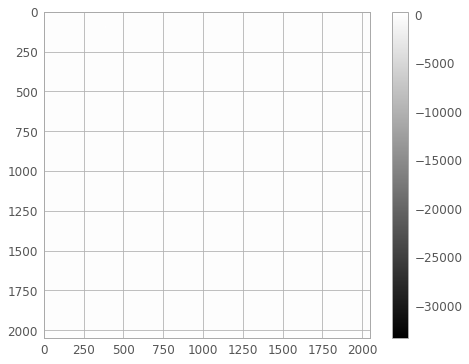

In [32]:
plt.imshow(Ha_final, cmap='gray')
plt.colorbar()

In [33]:
def dust_correction(img, l):
    dust_corrected_img = img * 10**(A_v/2.5 * (a(l) + b(l)/5))
    
    return dust_corrected_img

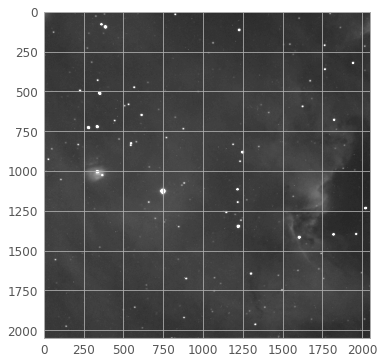

In [34]:
plt.imshow(Ha_final, cmap='gray', vmin=0, vmax=2)

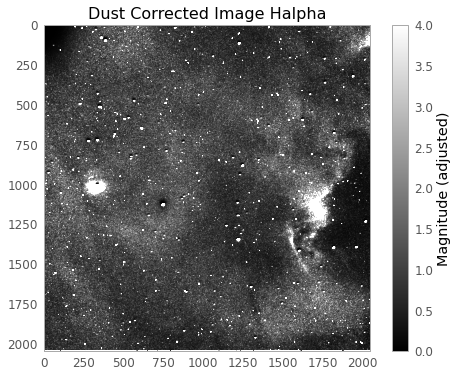

In [219]:
plt.imshow(dust_correction(Ha_final, Halpha_lambda), cmap='gray', vmin=0, vmax=4)
plt.rcParams["axes.grid"] = False
plt.colorbar(label='Magnitude (adjusted)')
plt.title(r'Dust Corrected Image Halpha', size=16)
plt.savefig("Dust_corr_Ha")

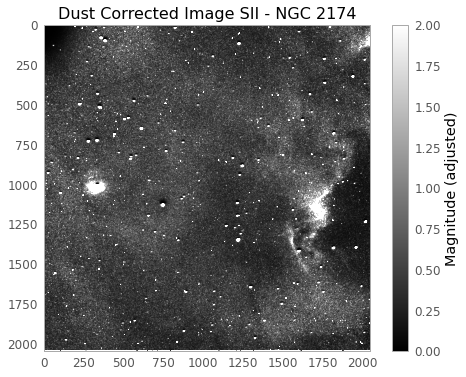

In [247]:
plt.imshow(dust_correction(SII_final, SII_lambda), cmap='gray', vmin=0, vmax=2)
plt.rcParams["axes.grid"] = False
plt.colorbar(label='Magnitude (adjusted)')
plt.title(r'Dust Corrected Image SII - NGC 2174', size=16)
plt.savefig("NGC2174_Dust_corr_SII")

In [90]:
numerM42 = 2.5*np.log10(2.86*(M42_Hb_final / M42_Ha_final))
A_v_M42 = numerM42 / denom

Text(0.5, 1.0, '$A_V$ Extinction Image - M42')

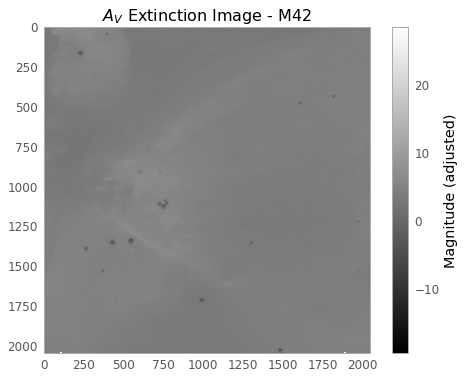

In [105]:
plt.imshow(A_v_M42, cmap='gray')
plt.rcParams["axes.grid"] = False
plt.colorbar(label='Magnitude (adjusted)')
plt.title(r'$A_V$ Extinction Image - M42', size=16)
#plt.savefig("A_V_M42")

Text(0.5, 1.0, 'SII/OIII')

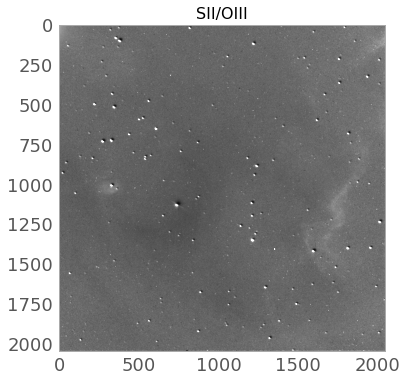

In [209]:
plt.imshow(SII_final / OIII_final, cmap='gray', vmin=0, vmax=1)
plt.rcParams["axes.grid"] = False
plt.title(r'SII/OIII', size=16)
#plt.savefig("A_V_M42")